## TSMD Course Project: Analysis of Aircraft Flight Data
### Author: MIRKO NARDI

### PART 1 - mobility data

### Introduction
We explore and analyze a dataset containing aircraft flight data as part of the **Time Series and Mobility Data** (TSMD) course.

### Dataset

We use the data provided by the non-profit OpenSky Network (https://opensky-network.org/). The dataset contains information on aircraft flights, including their positions, velocities, headings, and other flight parameters. The data is collected from a network of sensors deployed worldwide, which track aircraft in real-time.

OpenSky provides API access to the data, which can be used to retrieve flight data for a specific time period and geographical region.  
However, free access to the API is limited to a small number of requests per day. Custom paid subscriptions are available for more extensive access.

To overcome this limitation, we use the freely available dataset chunks provided by OpenSky Network. https://opensky-network.org/data/datasets. 

### *Weekly 24 hours* OpenSky

Among the ones available, we choose the **Weekly 24 hours of State Vector Data** (https://opensky-network.org/data/datasets#d1) that OpenSky provides for research purposes. 

It is a full snapshot 24 hours of flight data for every **Monday** of the the week from midnight to midnight UTC.  
It is the data with most details available (i.e., including trajectory data)

Coverage  
- From 2020-05-25 to 2022-06-27, only Monday days - (some missing hours)
- Location: Worldwide
- Data: State Vectors (position, velocity, heading, etc.) 
- Sample Rate: 10 seconds 


Content of the **State Vectors**: 
- **time**: Unix timestamp (seconds) of the record.
- **icao24**: Unique ICAO 24-bit address of the aircraft - (ID of the aircraft)
- **lat**: Latitude of the aircraft.
- **lon**: Longitude of the aircraft.
- **velocity**: Velocity of the aircraft (m/s).
- **heading**: Heading of the aircraft. Track angle as the clockwise angle from the geographic north.
- **vertrate**: Vertical rate of the aircraft. (>0  ascending, <0  descending). (m/s)
- **callsign**: The flight route number. (e.g., a flight that every day goes from Rome to Milan)
- **onground**: Boolean indicating if the aircraft is on the ground.
- **alert**: Boolean indicating if there is an emergency alert.
- **spi**: Boolean indicating if the SPI (Special Position Identification) is set.
- **squawk**: Squawk code of the aircraft.
- **baroaltitude**: Barometric altitude of the aircraft.
- **geoaltitude**: Geometric altitude of the aircraft.
- **lastposupdate**: Unix timestamp (seconds) of the last position update (in the aircraft)
- **lastcontact**: Unix timestamp (seconds) of the last contact with OpenSky

For more details, refer to the README file provided for the dataset https://opensky-network.org/data/datasets#d1 

In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
import os
import requests
from bs4 import BeautifulSoup

import glob

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt


import geopandas as gpd
import skmob


from zz_utils import *


import warnings
warnings.filterwarnings("ignore")

/home/mirko/miniforge3/envs/timeser3/lib/python3.8/site-packages/geopandas/_compat.py:124: UserWarning: The Shapely GEOS version (3.11.1-CAPI-1.17.1) is incompatible with the GEOS version PyGEOS was compiled with (3.10.4-CAPI-1.16.2). Conversions between both will be slow.
  warnings.warn(


### Data Download 
The following cells are for downloading the data and will be **skipped**. \
If you are interested in this step:
- remove the %%script macro. 
- CAUTION: a lot of data will be downloaded and extracted. 


Otherwise, you can skip directly to the section on reading the zipped file.

In [3]:
%%script echo skipping

# TO DOWNLOAD ALL THE FILES
base_url = 'https://opensky-network.org/datasets/states/'

# start = "2020-05-25"; end = "2022-06-28"  # take all the data available 
# start = "2021"; end = "2022"              # take only the year 2021
start = "2021-01-25"; end = start           # take one day 

list_days = pd.date_range(start =start, end=end, freq="W-MON").strftime('%Y-%m-%d').tolist()
list_subdir = ['%02d' % i for i in range(24)] # 00 to 23

# Folder to download files to
download_path = 'opensky_data' 

for day in list_days:
    for subdir in list_subdir:
        url = base_url + day + '/' + subdir + '/'
        print("Starting: " + url)

        # CAUTION: This will download a lot of data. 
        # Note, some days have missing hours in the data
        download_files(url, download_path) 
        
        # CAUTION: This will extract a lot of data.
        extract_files(download_path)


skipping


In [4]:
%%script echo skipping

#filter = '2021'
#filter = '2021-01' 
# take one day
filter = '2021-01-25' 

download_path = 'opensky_data' 
# read downloaded files
all_files = glob.glob(os.path.join(download_path, "*.csv.gz"))
all_files = [f for f in all_files if filter in f]
all_files.sort()
all_files # VERIFY IF MISSING HOURS

skipping


In [5]:
%%script echo skipping

# Read all first and then concat is faster - require more memory
df_list = []
for f in all_files:
    print(f)
    #df_temp = pd.read_csv(f,engine='c', low_memory=False)
    df_temp = pd.read_csv(f,engine='pyarrow') # pip install pyarrow
    # drop column now to save memory
    df_list.append(df_temp)
df = pd.concat(df_list, ignore_index=True) 

# save the data
#df.to_parquet(f'opensky_data/cached/opensky_data_saved_{filter}.gzip', compression='gzip') # cache the data

skipping


In [6]:
%%script echo skipping
def write_df_compressed_chunks(df, base_filename, num_chunks = 20, compression='gzip'):
    # Calculate the number of rows per chunk
    rows_per_chunk = len(df) // num_chunks
    
    # Write the DataFrame to compressed CSV in chunks
    for i in range(num_chunks):
        start_row = i * rows_per_chunk
        if i < num_chunks - 1:
            end_row = (i + 1) * rows_per_chunk
        else:
            end_row = len(df)  # Make sure to include any remaining rows in the last chunk
        chunk = df.iloc[start_row:end_row]
        chunk_filename = f"{base_filename}_part_{i + 1}.gzip"
        #chunk.to_csv(chunk_filename, index=False, compression=compression) 
        #chunk.to_csv(chunk_filename, index=False)  # default compression=infer, from filename
        chunk.to_parquet(chunk_filename, index=False) # default compression=snappy
        print(f"Written {chunk_filename}")

# Write the DataFrame in chunks
write_df_compressed_chunks(df, f'opensky_data/cached/opensky_data_saved_{filter}', num_chunks = 15)

skipping


<a id="read_ready"></a>

### Read one day of data
- Even just one day is already very big: ~3.2 GB in memory - ~0.9 GB on disk (compressed)
- The data is wordlwide 


In [7]:
# read cached data (2021-01-25)
df_raw = pd.read_parquet(f'opensky_data/cached/') 

In [8]:
df_raw.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 30639993 entries, 0 to 30639992
Data columns (total 16 columns):
 #   Column         Dtype  
---  ------         -----  
 0   time           int64  
 1   icao24         object 
 2   lat            float64
 3   lon            float64
 4   velocity       float64
 5   heading        float64
 6   vertrate       float64
 7   callsign       object 
 8   onground       bool   
 9   alert          bool   
 10  spi            bool   
 11  squawk         float64
 12  baroaltitude   float64
 13  geoaltitude    float64
 14  lastposupdate  float64
 15  lastcontact    float64
dtypes: bool(3), float64(10), int64(1), object(2)
memory usage: 3.1+ GB


In [9]:
# some preprocessing

def preprocess(df1):
    df = df1.copy()
    df = df.drop(columns=[ 'lastcontact', 'squawk', 'alert', 'spi'], errors='ignore') # drop unnecessary columns
    df['icao24'] = df['icao24'].str.strip()
    df['callsign'] = df['callsign'].str.strip()
    df['velocity'] = df['velocity'] * 3.6 # convert to km/h for more familiar units
    
    df['lastposupdate'] = pd.to_datetime(df['lastposupdate'], unit='s')
    df['time'] = pd.to_datetime(df['time'], unit='s')
    
    df = df.sort_values(by='time').reset_index(drop=True)

    # not now
    #df['datetime'] = df['time']
    #df['datetime'] = df['lastposupdate']
    
    # move lastposupdate at the beginning (close to time)
    cols =  ['time','lastposupdate'] + [col for col in df if col not in ['time','lastposupdate']]
    df = df[cols]

    return df


df = preprocess(df_raw)
df.head()

,time,lastposupdate,icao24,lat,lon,velocity,heading,vertrate,callsign,onground,baroaltitude,geoaltitude
0,2021-01-25 00:00:00,2021-01-24 23:59:58.816999936,a7136d,41.446976,-96.903159,459.668838,272.309063,7.47776,EJA555,False,10477.50,10363.20
1,2021-01-25 00:00:00,2021-01-24 23:59:58.503000064,4bcc66,50.151005,9.455072,884.481940,118.926426,9.42848,THY2YT,False,11369.04,10797.54
2,2021-01-25 00:00:00,2021-01-24 23:59:58.959000064,4404bd,49.623149,9.756527,914.797230,108.655034,0.00000,TAY4081,False,11277.60,NaN
3,2021-01-25 00:00:10,2021-01-25 00:00:09.766000128,abf396,43.746814,-92.562823,896.407402,145.521960,2.60096,SWA845,False,9448.80,9220.20
4,2021-01-25 00:00:10,2021-01-24 23:59:58.556000000,e48006,-23.109329,-46.460483,584.298891,215.453233,-7.47776,GLO1765,False,3954.78,4175.76


### A first look

Where is Elon Musk Jet?

In [10]:
df_elon = df[df['icao24'] == 'a835af']  # https://en.wikipedia.org/wiki/ElonJet


In [11]:
# skmob does not accept nan lan lon values
df_elon = df_elon.dropna(subset=['lat', 'lon']) # remove rows 
tdf = skmob.TrajDataFrame(df_elon, datetime='lastposupdate', user_id='icao24', latitude='lat', longitude='lon')

In [12]:
tdf.plot_trajectory(max_users=1, max_points=None, zoom=4)

### Lets have a better look to missing values
We notice:
- **time** and **icao24** are never NaN
- **lat** and **lon** and **lastposupdate** are NaN at the same time
- **callsign** is never NaN but can be empty strings ''
    - we **DON'T** need callsign for the analysis, but is useful for verification

Recall
- **time** is the timestamp of the record (state vector) when collected in OpenSky database, is continuisly generated for some period after the last contact
- **lastposupdate** is the timestamp in the aircraft when the last position was updated, can be missing
    - In other words, there can be 'holes' in lastposupdate, but not in time
    
- **callsign** is the flight route number. (e.g., a flight that every day goes from Rome to Milan)
    - Can be empty if the aircraft is not in a flight route 

Lets focus on those for now

Note: **on_ground** does **NOT** appear to be reliable for stop detetion

In [13]:
df.isna().sum()

time                   0
lastposupdate    3448267
icao24                 0
lat              3448267
lon              3448267
velocity         4946002
heading          4946002
vertrate         4908150
callsign               0
onground               0
baroaltitude     4161053
geoaltitude      5958915
dtype: int64

In [14]:
# check nan lat
df[df.isna()['lat']].head(20)

,time,lastposupdate,icao24,lat,lon,velocity,heading,vertrate,callsign,onground,baroaltitude,geoaltitude
39,2021-01-25 00:00:10,NaT,3c83bd,NaN,NaN,NaN,NaN,NaN,TX00,True,NaN,NaN
41,2021-01-25 00:00:10,NaT,3c4d97,NaN,NaN,NaN,NaN,NaN,,False,4251.96,NaN
44,2021-01-25 00:00:10,NaT,c1ed7a,NaN,NaN,NaN,NaN,NaN,TEST1234,False,4480.56,NaN
51,2021-01-25 00:00:10,NaT,781077,NaN,NaN,300.691774,196.090816,9.7536,,False,1028.70,NaN
52,2021-01-25 00:00:10,NaT,abb5a3,NaN,NaN,618.434374,240.978727,0.0000,ASH6076,False,NaN,NaN
53,2021-01-25 00:00:10,NaT,c1ed66,NaN,NaN,NaN,NaN,NaN,TEST1234,True,NaN,NaN
67,2021-01-25 00:00:10,NaT,a1d10c,NaN,NaN,NaN,NaN,NaN,AAY421,True,701.04,NaN
68,2021-01-25 00:00:10,NaT,0ae04e,NaN,NaN,NaN,NaN,NaN,,True,NaN,NaN
70,2021-01-25 00:00:10,NaT,3c1ff6,NaN,NaN,NaN,NaN,NaN,TEST1234,False,9448.80,NaN
81,2021-01-25 00:00:10,NaT,c1e17e,NaN,NaN,NaN,NaN,NaN,YZTX2A,True,2628.90,NaN


### Dataset Reduction
Since the dataset is too large, containing worldwide flights, we will reduce its size by filtering it to include flights from specific airline companies. \
This will help streamline our analysis and focus on a more manageable subset of data.

In [15]:
# We can filter by callsign prefix

# Ryanair 
call_filter = ['RYR'] 

# multiple companies
#call_filter = ['RYR', 'WZZ'] 

# Start from the callsign to get the IDs (icao24) of all the company aircrafts
ryan_aircraft = df[df['callsign'].str.startswith(tuple(call_filter))]['icao24'].unique()

print(ryan_aircraft)

# icao24 has no missing values, we use it to filter the data
df_select = df[df['icao24'].isin(ryan_aircraft)]
df_select 

['4d227b' '4d2272' '48c138' '4d221f' '48c128' '4ca8da' '4d2211' '4ca4f1'
 '4ca24e' '4ca9d3' '4d2287' '4d2246' '4ca243' '4ca4ec' '4d223f' '4d221a'
 '4d227f' '4d21fd' '4d220a' '4ca259' '4d2245' '4d224e' '4ca9ea' '48c227'
 '48c12b' '4ca737' '4ca4f0' '4cafcf' '4ca6fb' '4ca621' '4ca56d' '4d2220'
 '4ca84e' '4ca892' '4ca855' '4ca1c1' '4cafb3' '4ca2a8' '4d2251' '4ca910'
 '4ca24f' '48c125' '4ca2c0' '4ca740' '4ca911' '4d2260' '4ca97b' '4ca8e9'
 '4ca84b' '4ca700' '4d2264' '4d2208' '4ca6a5' '4ca244' '4d22c7' '48c134'
 '4ca301' '4ca61d' '4d22af' '4ca225' '4d224f' '48c131' '4d227c' '4d221e'
 '4ca6a4' '4ca9ec' '4ca4f7' '4ca9cf' '4ca8d9' '4d2218' '48c231' '4ca80f'
 '48c225' '4caa61' '4ca766' '4ca303' '4ca56a' '48c12d' '4ca2c2' '4cafd3'
 '4ca263' '4d21ef' '4ca8e5' '4cafd2' '4d220c' '4ca625' '4ca80d' '4d2209'
 '4ca1d4' '4ca84c' '4cafc4' '4d225a' '4ca567' '4ca804' '4ca1ff' '4ca75e'
 '4ca6a6' '4d2247' '4ca8e4' '4d2229' '48c224' '4caa60' '4cafb4' '4d2244'
 '4ca2ac' '4d225b' '4d225e' '4ca2c4' '4ca1d0' '4caf

,time,lastposupdate,icao24,lat,lon,velocity,heading,vertrate,callsign,onground,baroaltitude,geoaltitude
5383207,2021-01-25 04:37:10,2021-01-25 04:37:08.004000000,4d227b,44.569530,26.089832,NaN,NaN,NaN,,True,NaN,NaN
5385906,2021-01-25 04:37:20,2021-01-25 04:37:19.522000128,4d227b,44.569485,26.089230,NaN,NaN,NaN,,True,NaN,NaN
5387101,2021-01-25 04:37:30,2021-01-25 04:37:28.865999872,4d227b,44.569450,26.088811,NaN,NaN,NaN,,True,NaN,NaN
5391070,2021-01-25 04:37:40,2021-01-25 04:37:38.256000000,4d227b,44.569427,26.088442,NaN,NaN,NaN,RYR4NN,True,NaN,NaN
5392806,2021-01-25 04:37:50,2021-01-25 04:37:49.615000064,4d227b,44.569382,26.087952,NaN,NaN,NaN,RYR4NN,True,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...
29983562,2021-01-25 23:33:20,2021-01-25 23:29:02.269999872,4cafb4,40.458026,-3.555388,NaN,NaN,NaN,,True,NaN,NaN
29986233,2021-01-25 23:33:30,2021-01-25 23:29:02.269999872,4cafb4,40.458026,-3.555388,NaN,NaN,NaN,,True,NaN,NaN
29992370,2021-01-25 23:33:40,2021-01-25 23:29:02.269999872,4cafb4,40.458026,-3.555388,NaN,NaN,NaN,,True,NaN,NaN
29993007,2021-01-25 23:33:50,2021-01-25 23:29:02.269999872,4cafb4,40.458026,-3.555388,NaN,NaN,NaN,,True,NaN,NaN


In [16]:
df_select.info()

<class 'pandas.core.frame.DataFrame'>
Index: 130081 entries, 5383207 to 29997229
Data columns (total 12 columns):
 #   Column         Non-Null Count   Dtype         
---  ------         --------------   -----         
 0   time           130081 non-null  datetime64[ns]
 1   lastposupdate  129802 non-null  datetime64[ns]
 2   icao24         130081 non-null  object        
 3   lat            129802 non-null  float64       
 4   lon            129802 non-null  float64       
 5   velocity       126228 non-null  float64       
 6   heading        126228 non-null  float64       
 7   vertrate       126228 non-null  float64       
 8   callsign       130081 non-null  object        
 9   onground       130081 non-null  bool          
 10  baroaltitude   123305 non-null  float64       
 11  geoaltitude    122913 non-null  float64       
dtypes: bool(1), datetime64[ns](2), float64(7), object(2)
memory usage: 12.0+ MB


In [17]:
# check one aircraft in one day 
df_select[df_select['icao24'] == '4d227b']

,time,lastposupdate,icao24,lat,lon,velocity,heading,vertrate,callsign,onground,baroaltitude,geoaltitude
5383207,2021-01-25 04:37:10,2021-01-25 04:37:08.004000000,4d227b,44.569530,26.089832,NaN,NaN,NaN,,True,NaN,NaN
5385906,2021-01-25 04:37:20,2021-01-25 04:37:19.522000128,4d227b,44.569485,26.089230,NaN,NaN,NaN,,True,NaN,NaN
5387101,2021-01-25 04:37:30,2021-01-25 04:37:28.865999872,4d227b,44.569450,26.088811,NaN,NaN,NaN,,True,NaN,NaN
5391070,2021-01-25 04:37:40,2021-01-25 04:37:38.256000000,4d227b,44.569427,26.088442,NaN,NaN,NaN,RYR4NN,True,NaN,NaN
5392806,2021-01-25 04:37:50,2021-01-25 04:37:49.615000064,4d227b,44.569382,26.087952,NaN,NaN,NaN,RYR4NN,True,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...
11317924,2021-01-25 11:38:50,2021-01-25 11:34:24.586999808,4d227b,44.569625,26.091190,204.735889,264.289407,-0.32512,RYR9K,False,NaN,NaN
11321280,2021-01-25 11:39:00,2021-01-25 11:34:24.586999808,4d227b,44.569625,26.091190,204.735889,264.289407,-0.32512,RYR9K,False,NaN,NaN
11323341,2021-01-25 11:39:10,2021-01-25 11:34:24.586999808,4d227b,44.569625,26.091190,204.735889,264.289407,-0.32512,RYR9K,False,NaN,NaN
11326635,2021-01-25 11:39:20,2021-01-25 11:34:24.586999808,4d227b,44.569625,26.091190,204.735889,264.289407,-0.32512,RYR9K,False,NaN,NaN


### Plotting trajectories values
Lets plot the key fields: latitude (lat), longitude (lon), and the last position update (lastposupdate). 

Grouping by icao24 will allow us to see the trajectory of each aircraft.

In [ ]:
dfs_by_aircraft = [(name,group) for name, group in df_select.groupby('icao24')]
for name, group in dfs_by_aircraft[:5]: # plot only some - DO TRIALS with diffrent slices
    print(name)

    # check lat lon NaN 'holes' 
    group.plot(x='time', y=['lat','lon'], title=name,figsize=(10, 4)) #  
    plt.show()
    #  check also time VS lastposupdate
    group['time_copy'] = group['time'] 
    group.plot(x='time', y=['time_copy','lastposupdate'], title=name,figsize=(10, 4)) 
    plt.show()


In [19]:
# Check what happens when the callsign is empty

print(df_select[df_select['callsign'] == ''].shape)

# unique aircrafts with empty callsign
air_list = df_select[df_select['callsign'] == '']['icao24'].unique()
print(air_list)

# take the first one (DO MANY TRIALS)
air_name = air_list[1]
df_single = df_select[df_select['icao24'] == air_name]

#condition = (df_single['callsign'] == '') & (df_single['vertrate'] > 0)
condition = df_single['callsign'] == ''

# Check neighboring rows when the callsign is empty
get_neighboring_rows(df_single, condition, 3,3).head(20) 

(1135, 12)
['4d227b' '4d2211' '4ca9d3' '4d2246' '4ca243' '4d221a' '48c128' '4d227f'
 '4d21fd' '4d220a' '48c227' '48c12b' '4d221f' '4ca737' '4ca4f0' '4ca8da'
 '4ca6fb' '4ca24e' '4ca56d' '4ca84e' '4ca892' '4ca1c1' '4ca910' '4d2245'
 '4ca24f' '48c125' '4ca740' '4cafcf' '4ca2c0' '4ca4f1' '4ca911' '4ca84b'
 '4ca9ea' '4d2264' '4d2208' '4ca4ec' '4ca259' '4ca6a5' '4d22c7' '4d223f'
 '4d22af' '4d224f' '4d227c' '4ca9ec' '4ca8d9' '4cafb3' '4ca80f' '4ca61d'
 '4ca766' '48c12d' '4cafd3' '48c134' '4d21ef' '4cafd2' '4d220c' '4ca625'
 '4ca80d' '4d2209' '4ca1d4' '4ca84c' '4cafb4' '4cafc4' '4d225a' '4ca567'
 '4ca1ff' '4d2247' '48c225' '48c224' '4ca56a' '4d2244' '4ca2ac' '4ca8e4'
 '4ca75e' '4cafc3' '4ca303' '4ca804' '4ca8d6' '4d225e' '4d2271' '4d225b'
 '4d2218' '4ca2c4' '4d2217' '4d222b' '48c139' '4ca562' '4ca739' '4ca1fe'
 '4ca2ad' '4ca8e5' '48c126' '4ca73d' '4ca76a' '4ca226' '4ca1d0' '4ca302']


,time,lastposupdate,icao24,lat,lon,velocity,heading,vertrate,callsign,onground,baroaltitude,geoaltitude
0,2021-01-25 05:33:20,2021-01-25 05:33:19.262000128,4d2211,37.480637,14.847906,437.593167,294.504160,6.17728,,False,3337.56,NaN
1,2021-01-25 05:33:30,2021-01-25 05:33:21.592999936,4d2211,37.481598,14.845276,452.464094,294.676863,6.17728,,False,3352.80,3360.42
2,2021-01-25 05:33:40,2021-01-25 05:33:39.020999936,4d2211,37.490753,14.820264,452.464094,294.676863,6.17728,RYR1BK,False,3467.10,3360.42
3,2021-01-25 05:33:50,2021-01-25 05:33:49.404999936,4d2211,37.496704,14.804019,534.470823,294.789007,14.95552,RYR1BK,False,3589.02,3535.68
4,2021-01-25 05:34:00,2021-01-25 05:33:59.778000128,4d2211,37.502518,14.788299,546.888574,294.829347,15.28064,RYR1BK,False,3741.42,3718.56


### Observations on missing values
NaN values in **lat** and **lon** and **lastposupdate** occurs simultaneously:
- in the middle of a flight
- at the beginning of a flight

→ we can: interpolate and bfill the position: fill the lastposupdate with the 'time' (seems a good approximation) 

Empty **callsign** values ('') occur under specific scenarios:

- **Start of the Day**: Often seen at the first departure, indicating possible late assignment or recording of the callsign.
- **Within consistent blocks**: Empty values are flanked by identical callsigns, suggesting possible intermittent recording issues.
- **Between Different Callsigns**: Closer (in time) to the subsequent callsign, implying that callsigns may be assigned after takeoff.

→ we can fill with backfill


### Data Adjustment for the Analysis

We will add one hour to the last position of each aircraft's data \
This adjustment will aid in the analysis by allowing us to detect the last position of the day as a stop. 

→ otherwise, last aircraft arrival will be missing

In [20]:
# df_select = df[df['icao24'].isin(ryan_aircraft)] # rebuild df_select for different tests
def repair(group):
    # if all NaN lat, drop the group
    if group['lat'].isna().all():
        return group.dropna() # return empty dataframe

    # interpolate 'holes' in the data
    group['lat_repair'] = group['lat'].interpolate(method='linear')
    group['lon_repair'] = group['lon'].interpolate(method='linear')

    # remaining NaN are at the beginning of the group
    group['lat_repair'] = group['lat_repair'].fillna(method='bfill')
    group['lon_repair'] = group['lon_repair'].fillna(method='bfill')


    # Repairing NaN lastposupdate with time is a good approximation
    group['lastposupdate_repair'] = group['lastposupdate'].fillna(group['time'])
    
    
    # repairing empty '' callsign with the last known callsign
    group.loc[:, 'callsign_repair'] = group['callsign'].replace('', method='bfill') 
    # Remaining callsign can be ffilled with the first known callsign
    group.loc[:, 'callsign_repair'] = group['callsign_repair'].replace('', method='ffill')

    # Data Adjustment for last stop detection
    # CAUTION: this is a simplification, may not work for overnight flights or extended time zones 
    
    #last row of group
    last_row = group.iloc[-1].copy()
    # add 1 hour to lastposupdate_repair
    last_row['lastposupdate_repair'] += pd.Timedelta(hours=1)
    last_row['lastposupdate'] += pd.Timedelta(hours=1) # for consistency, or drop the column lastposupdate
    last_row['time'] += pd.Timedelta(hours=1)
    # Append the modified last row to the dataframe
    group = pd.concat([group, pd.DataFrame([last_row])], ignore_index=True)
    
    return group

dd = df_select.groupby('icao24').apply(repair)
# reconstruct df_select from dd
df_select = pd.concat([dd], ignore_index=True).sort_values(by=['time']).reset_index(drop=True)

In [ ]:
# check if the interpolation worked

dfs_by_aircraft = [(name,group) for name, group in df_select.groupby('icao24')]
for name, group in dfs_by_aircraft[:5]: 
    print(name)
    group.plot(x='time', y=['lat_repair','lat'], title=name,figsize=(10, 4)) #  'lastposupdate' 
    group.plot(x='time', y=['lastposupdate_repair','lastposupdate'], title=name,figsize=(10, 4)) #  'lastposupdate' 
    plt.show()


In [22]:
# check if the callsign is repaired
df_select[df_select['callsign_repair'] == ''].shape

(0, 16)

In [23]:
# last update in the day of each aircraft
#last_update = df_select.groupby('icao24').tail(1)['lastposupdate_repair']
# check if the last update is near the end of the day 
#last_update[(last_update.dt.hour >= 23) & (last_update.dt.minute >= 30)] 

## Analysis of the trajectories
Lets now build the TrajDataFrame. \
We aim to find the stops of the aircrafts only using the position data. \

In [24]:
dfm = df_select.copy() # temp copy

# If you want to try unprocessed data
#dfm = dfm.dropna(subset=['lat'])  # remove rows with NaN lat,long, lastposupdate otherwise skmob raises an error
#tdf = skmob.TrajDataFrame(dfm, timestamp=True, latitude='lat', longitude='lon', datetime='lastposupdate', user_id='icao24')

dfm = dfm.drop(columns=['lat', 'lon']) # drop columns named lat lon othewise skmob raises an error
tdf = skmob.TrajDataFrame(dfm, timestamp=True, latitude='lat_repair', longitude='lon_repair', datetime='lastposupdate_repair', user_id='icao24')

# you can use callsign_repair as user_id to verify routes (our target)
# tdf = skmob.TrajDataFrame(dfm, timestamp=True, latitude='lat_repair', longitude='lon_repair', datetime='lastposupdate_repair', user_id='callsign_repair') 


# sort by datetime
tdf = tdf.sort_by_uid_and_datetime()


In [25]:
# Filter by the first k aircrafts

#k = 5
#tdf = tdf[tdf['uid'].isin(tdf['uid'].unique()[:k])]
#tdf['uid'].nunique()
#tdf['uid'].value_counts()

In [26]:
#tdf.plot_trajectory(max_users=10, max_points=None, zoom = 4, start_end_markers=True)
# add info to the marker
tdf.plot_trajectory(max_users=30, max_points=None, zoom = 4, start_end_markers=True)

In [27]:
from skmob.preprocessing import filtering
from skmob.preprocessing import compression
f_tdf = filtering.filter(tdf, max_speed_kmh=4000)
print('Number of records:\t%s'%len(f_tdf))
print('Filtered points:\t%s'%(len(tdf) - len(f_tdf)))

# take the difference between the two dataframes
df_diff = pd.concat([tdf, f_tdf]).drop_duplicates(keep=False)

# the aircrafts that have trajectory points filtered out
df_diff['uid'].value_counts()

Number of records:	118045
Filtered points:	12162


uid
4ca766    420
4ca56d    385
4d220c    321
4cafb4    305
4ca9ec    285
         ... 
4cafd3     29
4ca2c0     29
4ca737     29
4d2247     26
4d2220     12
Name: count, Length: 126, dtype: int64

In [28]:
# compare the filtered trajectories with the original ones

# take one specific
uid_list = ['4ca766'] 

# take some uids randomly 
#uid_list = np.random.choice(df_diff['uid'].unique(), 3)

map_f = tdf[tdf['uid'].isin(uid_list)].plot_trajectory(max_users=20, max_points=None,start_end_markers=True, zoom=4, hex_color='blue')
f_tdf[f_tdf['uid'].isin(uid_list)].plot_trajectory(max_users=20, max_points=None,map_f=map_f,start_end_markers=True, zoom=4, hex_color='red')

In [29]:
map_f = tdf[tdf['uid'].isin(uid_list)].plot_stops(max_users=10,zoom=7, radius=1, hex_color = 'blue')
f_tdf[f_tdf['uid'].isin(uid_list)].plot_stops(max_users=10, zoom=7, radius=1, hex_color = 'red', map_f=map_f)

In [30]:
# fc: filtered and compressed
fc_tdf = compression.compress(f_tdf, spatial_radius_km=1)
print('Points of the filtered trajectory:\t%s'%len(f_tdf))
print('Points of the compressed trajectory:\t%s'%len(fc_tdf))
print('Compressed points:\t\t\t%s'%(len(f_tdf)-len(fc_tdf)))

Points of the filtered trajectory:	118045
Points of the compressed trajectory:	110744
Compressed points:			7301


In [31]:
# now compare filtered and compressed with the original

map_f = tdf[tdf['uid'].isin(uid_list)].plot_trajectory(max_users=20, max_points=None,start_end_markers=True, zoom=4, hex_color='red')
fc_tdf[fc_tdf['uid'].isin(uid_list)].plot_trajectory(max_users=20, max_points=None,map_f=map_f,start_end_markers=True, zoom=4, hex_color='blue', opacity=0.5)

### Observations
The best TrajDataFrame to use is the original tdf.
- Filtering by maxspeed increases the gaps between trajectories.
- Compression can help reduce the data size, but original the sample rate is not too high. 

### Stop Detection

In [32]:
from skmob.preprocessing import detection
# tdf, f_tdf, fc_tdf
tdf_stop = detection.stay_locations(tdf, stop_radius_factor=1, 
                          minutes_for_a_stop=30.0, spatial_radius_km=40) 

#fcs_tdf
map_f = tdf_stop.plot_trajectory(max_users=1000, max_points=None, zoom=4,start_end_markers=False)
tdf_stop.plot_stops(max_users=1000, map_f=map_f, zoom = 4)

In [33]:
# stay_locations from filtered and compressed data. Some real stops are missing

# tdf, f_tdf, fc_tdf
fc_tdf = compression.compress(f_tdf, spatial_radius_km=1)
fc_tdf_stop = detection.stay_locations(fc_tdf, stop_radius_factor=1, 
                          minutes_for_a_stop=30.0, spatial_radius_km=40) 
#fcs_tdf
map_f = fc_tdf_stop.plot_trajectory(max_users=1000, max_points=None, zoom=3.5,start_end_markers=False)
fc_tdf_stop.plot_stops(max_users=1000, map_f=map_f, zoom = 4)

Some routes are broken - too many missing data to repair (next cell works only on ryainair data for the choosen day)

<Axes: title={'center': '4ca9ec'}, xlabel='time'>

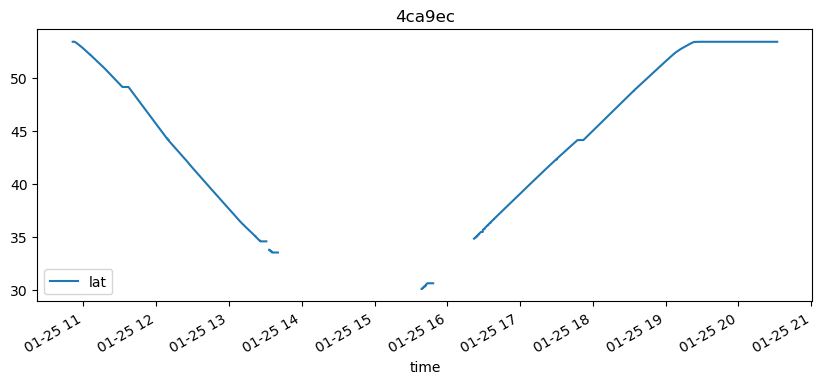

In [34]:
# Dublin - Canary Islands - some stops in the middle of the ocean

df_single = df_select[df_select['icao24'] == '4ca9ec'] 
df_single.plot(x='time', y=['lat'], title='4ca9ec',figsize=(10, 4)) 
#df_single.plot(x='time', y=['lat_repair'], title='4ca9ec',figsize=(10, 4)) 

# plot the stops
#map_f = tdf_stop[tdf_stop["uid"].isin(['4ca9ec','4cafd2'])].plot_trajectory(max_users=1000, max_points=None, zoom=3.5,start_end_markers=False)
#tdf_stop[tdf_stop["uid"].isin(['4ca9ec','4cafd2'])].plot_stops(max_users=1000, map_f=map_f, zoom = 4)

### Detected Stops Verification

We verify detected stops using the last signal for each callsign. (recall, a callsign is a specific flight route number) 

→ The detected stops are very accurate.

In [35]:
# take the last row grouping by callsign
mapp = tdf.groupby('callsign_repair').last().sort_values(by='datetime').plot_stops(max_users=1000, zoom=4, hex_color='red')
#tdf.groupby('callsign').first().sort_values(by='datetime').plot_stops(map_f=mapp,max_users=1000, zoom=4, hex_color='blue')

# compare with the stay locations detected by skmob
mapp = tdf_stop.drop(columns=['leaving_datetime']).plot_stops(map_f=mapp, max_users=1000, zoom=4, hex_color='blue') # leaving_datetime make the dot bigger
mapp 
#tdf_stop.plot_stops(map_f=mapp, max_users=1000, zoom=4, hex_color='blue') 

## Further analysis
We now associate the detected stops with locations (cities, countries) in order to find the most common stops

In [36]:
# Lets get airports data

airports_url = 'https://raw.githubusercontent.com/jpatokal/openflights/master/data/airports.dat'
airports_columns = ['Airport_ID', 'Name', 'City', 'Country', 'IATA', 'ICAO', 'Latitude', 'Longitude', 'Altitude', 'Timezone', 'DST', 'Tz_database_time_zone', 'Type', 'Source']
airports_columns = [col.lower() for col in airports_columns]
airports = pd.read_csv(airports_url, names=airports_columns)

In [37]:
airports
# convert to geodataframe
gdf_airports = gpd.GeoDataFrame(airports, geometry=gpd.points_from_xy(airports['longitude'], airports['latitude'])) # !!! inverse lat lon
gdf_airports

,airport_id,name,city,country,iata,icao,latitude,longitude,altitude,timezone,dst,tz_database_time_zone,type,source,geometry
0,1,Goroka Airport,Goroka,Papua New Guinea,GKA,AYGA,-6.081690,145.391998,5282,10,U,Pacific/Port_Moresby,airport,OurAirports,POINT (145.39200 -6.08169)
1,2,Madang Airport,Madang,Papua New Guinea,MAG,AYMD,-5.207080,145.789001,20,10,U,Pacific/Port_Moresby,airport,OurAirports,POINT (145.78900 -5.20708)
2,3,Mount Hagen Kagamuga Airport,Mount Hagen,Papua New Guinea,HGU,AYMH,-5.826790,144.296005,5388,10,U,Pacific/Port_Moresby,airport,OurAirports,POINT (144.29601 -5.82679)
3,4,Nadzab Airport,Nadzab,Papua New Guinea,LAE,AYNZ,-6.569803,146.725977,239,10,U,Pacific/Port_Moresby,airport,OurAirports,POINT (146.72598 -6.56980)
4,5,Port Moresby Jacksons International Airport,Port Moresby,Papua New Guinea,POM,AYPY,-9.443380,147.220001,146,10,U,Pacific/Port_Moresby,airport,OurAirports,POINT (147.22000 -9.44338)
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7693,14106,Rogachyovo Air Base,Belaya,Russia,\N,ULDA,71.616699,52.478298,272,\N,\N,\N,airport,OurAirports,POINT (52.47830 71.61670)
7694,14107,Ulan-Ude East Airport,Ulan Ude,Russia,\N,XIUW,51.849998,107.737999,1670,\N,\N,\N,airport,OurAirports,POINT (107.73800 51.85000)
7695,14108,Krechevitsy Air Base,Novgorod,Russia,\N,ULLK,58.625000,31.385000,85,\N,\N,\N,airport,OurAirports,POINT (31.38500 58.62500)
7696,14109,Desierto de Atacama Airport,Copiapo,Chile,CPO,SCAT,-27.261200,-70.779198,670,\N,\N,\N,airport,OurAirports,POINT (-70.77920 -27.26120)


<Axes: >

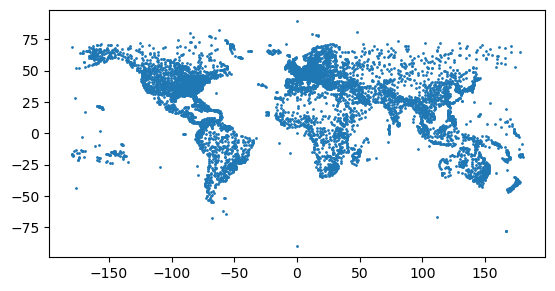

In [38]:
gdf_airports.plot(markersize=1)

In [39]:
# Low resolution world map given by geopandas. Overseas territories are missing. No maritime boundaries. 
# Use this for simplicity

#gpd.datasets.available
world = gpd.read_file(gpd.datasets.get_path('naturalearth_lowres')).to_crs(epsg=4326)
europe = world[world['continent'] == 'Europe']

In [40]:
# Low resolution world map given by geopandas. Overseas territories are missing. No maritime boundaries. 
#gpd.datasets.available
#world = gpd.read_file(gpd.datasets.get_path('naturalearth_lowres')).to_crs(epsg=4326)
#europe = world[world['continent'] == 'Europe']

# High res maps. (e.g. include overseas territories) but still no maritime borders
url = "https://github.com/nvkelso/natural-earth-vector/blob/master/geojson/ne_50m_admin_0_countries.geojson?raw=true" # also ne_10m_

# includes provinces/states
#url = 'https://github.com/nvkelso/natural-earth-vector/blob/master/geojson/ne_10m_admin_1_states_provinces.geojson?raw=true'

world = gpd.read_file(url).to_crs(epsg=4326)
world = world.rename(columns={'SOVEREIGNT':'name'}) # name of the country is in SOVEREIGNT


In [41]:
# We cannot use only europe - some european flights are intercontinental (e.g. to Morocco)
#europe = world[world['CONTINENT']=='Europe']

<Axes: >

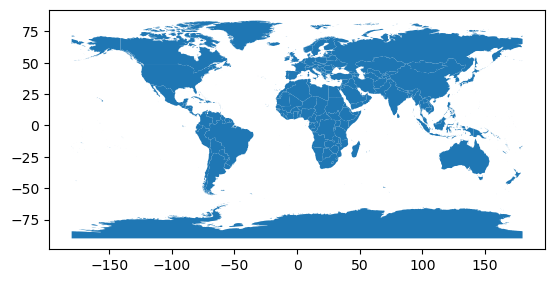

In [42]:
world.plot()

In [43]:
gdf_airports

,airport_id,name,city,country,iata,icao,latitude,longitude,altitude,timezone,dst,tz_database_time_zone,type,source,geometry
0,1,Goroka Airport,Goroka,Papua New Guinea,GKA,AYGA,-6.081690,145.391998,5282,10,U,Pacific/Port_Moresby,airport,OurAirports,POINT (145.39200 -6.08169)
1,2,Madang Airport,Madang,Papua New Guinea,MAG,AYMD,-5.207080,145.789001,20,10,U,Pacific/Port_Moresby,airport,OurAirports,POINT (145.78900 -5.20708)
2,3,Mount Hagen Kagamuga Airport,Mount Hagen,Papua New Guinea,HGU,AYMH,-5.826790,144.296005,5388,10,U,Pacific/Port_Moresby,airport,OurAirports,POINT (144.29601 -5.82679)
3,4,Nadzab Airport,Nadzab,Papua New Guinea,LAE,AYNZ,-6.569803,146.725977,239,10,U,Pacific/Port_Moresby,airport,OurAirports,POINT (146.72598 -6.56980)
4,5,Port Moresby Jacksons International Airport,Port Moresby,Papua New Guinea,POM,AYPY,-9.443380,147.220001,146,10,U,Pacific/Port_Moresby,airport,OurAirports,POINT (147.22000 -9.44338)
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7693,14106,Rogachyovo Air Base,Belaya,Russia,\N,ULDA,71.616699,52.478298,272,\N,\N,\N,airport,OurAirports,POINT (52.47830 71.61670)
7694,14107,Ulan-Ude East Airport,Ulan Ude,Russia,\N,XIUW,51.849998,107.737999,1670,\N,\N,\N,airport,OurAirports,POINT (107.73800 51.85000)
7695,14108,Krechevitsy Air Base,Novgorod,Russia,\N,ULLK,58.625000,31.385000,85,\N,\N,\N,airport,OurAirports,POINT (31.38500 58.62500)
7696,14109,Desierto de Atacama Airport,Copiapo,Chile,CPO,SCAT,-27.261200,-70.779198,670,\N,\N,\N,airport,OurAirports,POINT (-70.77920 -27.26120)


In [44]:
from shapely.geometry import Point

# given a row of tdf_stop, find the nearest airport
def min_distance(row, gdf_airports):
    point = Point(row['lng'], row['lat'])
    distances = gdf_airports.distance(point)
    min = distances.min()
    min_index = distances.argmin()

    # append this information to the received row
    ret = pd.Series({
        'air_name_near': gdf_airports.iloc[min_index]['name'],   
        'city' : gdf_airports.iloc[min_index]['city'],
        'country': gdf_airports.iloc[min_index]['country'],
        #'callsign_repair' : row['callsign_repair'],
        
        #'lat' : gdf_airports.iloc[min_index]['Latitude'],
        #'lng' : gdf_airports.iloc[min_index]['Longitude'],
    })

    # add min'dist_near': min to ret
    #ret = gdf_airports.iloc[min_index]

    ret['dist_near'] = min
    ret = pd.concat([row, ret])

    # Return the 'name' at the index of the minimum distance
    return ret

#tdf_stop.apply( ... # there is some bug using apply on tdf_stop
closest_air = pd.DataFrame(tdf_stop).apply(lambda x: min_distance(x, gdf_airports), axis=1)

#clostes_air = gpd.GeoDataFrame(closest_air, geometry=gpd.points_from_xy(closest_air['lng'], closest_air['lat'])) # inverse lat lon

In [45]:
#callsign_repair	leaving_datetime	air_name_near	city	country	callsign_repair	dist_near
closest_air[['callsign_repair','leaving_datetime','air_name_near','city','country','dist_near']].head(20)

,callsign_repair,leaving_datetime,air_name_near,city,country,dist_near
0,RYR9127,2021-01-25 10:49:09.769999872,Brussels South Charleroi Airport,Charleroi,Belgium,0.029599
1,RYR9127,2021-01-25 13:11:45.242000128,Vienna International Airport,Vienna,Austria,0.007994
2,RYR5891,2021-01-25 19:02:49.999000064,Eindhoven Airport,Eindhoven,Netherlands,0.016509
3,RYR5891,2021-01-25 21:24:26.181999872,Kraków John Paul II International Airport,Krakow,Poland,0.032479
4,RYR8319,2021-01-25 06:18:59.720000000,Gdańsk Lech Wałęsa Airport,Gdansk,Poland,0.013665
5,RYR7RV,2021-01-25 08:03:49.723000064,Stockholm Skavsta Airport,Stockholm,Sweden,0.151014
6,RYR7RV,2021-01-25 09:58:54.156000000,Gdańsk Lech Wałęsa Airport,Gdansk,Poland,0.031470
7,RYR8FN,2021-01-25 09:04:19.822000128,Eindhoven Airport,Eindhoven,Netherlands,0.017510
8,RYR8FN,2021-01-25 11:25:50.868999936,Modlin Airport,Warsaw,Poland,0.024282
9,RYR671,2021-01-25 13:22:01.812999936,Katowice International Airport,Katowice,Poland,0.011817


In [46]:
# Lets count most frequent locations

#closest_air[['city']].value_counts().head(20)
#closest_air[['air_name_near']].value_counts().head(20)
closest_air[['country']].value_counts().head(20)

country       
Italy             42
Spain             39
Portugal          27
United Kingdom    22
Ireland           17
France            15
Poland            15
Morocco           15
Belgium            7
Netherlands        6
Germany            6
Romania            4
Sweden             2
Austria            2
Latvia             2
Hungary            2
Norway             1
Luxembourg         1
Denmark            1
Bulgaria           1
Name: count, dtype: int64

### Let's do the same but using world map tessellation mapping

In [47]:
from skmob.tessellation.tilers import tiler
from skmob.utils import plot
#from skmob.utils.plot import plot_gdf
#from skmob import FlowDataFrame

In [ ]:
tessellation = world.explode().copy()
# set name of the country as tile_ID
tessellation = tessellation.rename(columns={'name': 'tile_ID'}) 
plot.plot_gdf(tessellation.explode(), popup_features=['tile_ID'], tiles='cartodb positron', zoom=3)

In [49]:
import warnings
warnings.filterwarnings('ignore')
stop_map = tdf_stop.mapping(tessellation)

Since tessellation does not cover maritime borders of countries, some stops close to the sea may not be detected.

In [50]:
# count unique including nan
stop_map['tile_ID'].value_counts(dropna=False)

tile_ID
NaN               45
Italy             30
Spain             27
United Kingdom    22
Ireland           16
Poland            15
Portugal          14
France            13
Belgium            9
Morocco            8
Netherlands        6
Germany            6
Romania            4
Austria            2
Sweden             2
Latvia             2
Hungary            2
Bulgaria           1
Norway             1
Luxembourg         1
Lithuania          1
Denmark            1
Name: count, dtype: int64

In [51]:
#stop_map is tdf_stop with the tessellation

stop_map

,time,lastposupdate,uid,velocity,heading,vertrate,callsign,onground,baroaltitude,geoaltitude,lat,lng,datetime,callsign_repair,leaving_datetime,tile_ID
0,2021-01-25 10:49:00,2021-01-25 10:48:59.716999936,48c125,353.343628,246.525382,9.75360,RYR9127,False,990.60,929.64,50.468328,4.481976,2021-01-25 09:49:19.712999936,RYR9127,2021-01-25 10:49:09.769999872,Belgium
1,2021-01-25 12:16:40,2021-01-25 12:11:45.242000128,48c125,196.390437,344.128821,-0.32512,RYR9127,False,11887.20,NaN,48.118290,16.569865,2021-01-25 12:08:37.278000128,RYR9127,2021-01-25 13:11:45.242000128,Austria
2,2021-01-25 19:02:40,2021-01-25 19:02:39.999000064,48c126,754.584243,87.327199,15.60576,RYR5891,False,7962.90,7574.28,51.458347,5.388831,2021-01-25 18:08:39.944000000,RYR5891,2021-01-25 19:02:49.999000064,Netherlands
3,2021-01-25 20:29:20,2021-01-25 20:24:26.181999872,48c126,225.198741,258.135610,-3.90144,RYR5891,False,373.38,342.90,50.096027,19.811616,2021-01-25 20:15:39.543000064,RYR5891,2021-01-25 21:24:26.181999872,Poland
4,2021-01-25 06:18:50,2021-01-25 06:18:49.491000064,48c128,643.989670,331.297488,13.00480,RYR8319,False,5173.98,4777.74,54.376656,18.479832,2021-01-25 05:28:30.000000000,RYR8319,2021-01-25 06:18:59.720000000,Poland
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
223,2021-01-25 15:09:40,2021-01-25 15:04:38.716999936,4d22af,176.329311,342.897271,0.00000,RYR7349,True,NaN,NaN,48.108793,16.562971,2021-01-25 14:47:29.642999808,RYR7349,2021-01-25 16:04:38.716999936,Austria
224,2021-01-25 10:23:30,2021-01-25 10:18:30.112000000,4d22c7,635.278645,259.246956,-23.73376,RYR7215,False,13716.00,4922.52,39.525833,0.523881,2021-01-25 10:15:49.601000192,RYR7215,2021-01-25 11:34:30.000000000,NaN
225,2021-01-25 15:00:30,2021-01-25 15:00:29.880999936,4d22c7,625.155769,236.969017,13.32992,RYR6BM,False,5684.52,5760.72,39.569030,2.757019,2021-01-25 11:54:59.535000064,RYR6BM,2021-01-25 15:00:39.578000128,Spain
226,2021-01-25 16:16:20,2021-01-25 16:11:28.712999936,4d22c7,211.135940,270.502582,-3.25120,RYR6BM,False,60.96,220.98,37.418289,-5.773666,2021-01-25 16:03:29.072000000,RYR6BM,2021-01-25 17:06:14.412000000,Spain


In [ ]:
tess_style = {'color':'red', 'fillColor':'black', 'weight': 2}
popup_features=['tile_ID'] # refer to the tessellation column name
map_f = plot.plot_gdf(tessellation, zoom=3, style_func_args=tess_style, popup_features=popup_features)

# non null tile_ID
#map_f = stop_map[~stop_map['tile_ID'].isnull()].plot_stops(max_users=200,map_f=map_f)

# null tile_ID
map_f = stop_map[stop_map['tile_ID'].isnull()].plot_stops(max_users=200,map_f=map_f) 
map_f

In [53]:
# Both techniques find the same locations - tile_ID is the name of the country

pd.concat([closest_air[['city','country']], stop_map['tile_ID']], axis=1).head(40)

,city,country,tile_ID
0,Charleroi,Belgium,Belgium
1,Vienna,Austria,Austria
2,Eindhoven,Netherlands,Netherlands
3,Krakow,Poland,Poland
4,Gdansk,Poland,Poland
5,Stockholm,Sweden,Sweden
6,Gdansk,Poland,Poland
7,Eindhoven,Netherlands,Netherlands
8,Warsaw,Poland,Poland
9,Katowice,Poland,Poland


## Flow Analysis

We will analyze the flow of aircraft between countries using FlowDataFrame.

Generating a FlowDataFrame using the tdf with all position trajectory data included would data would generate aircraft crossing multiple countries during a single flight, which isn't particularly useful for our analysis.

Therefore, we will create a FlowDataFrame using only the detected stops, allowing us to visualize the flow of aircraft specifically between countries.


In [54]:
# Take the staring point of each aircraft and concat with the stops

tdf_start = tdf.groupby('uid').first().reset_index() 
tdf_start_stop = pd.concat([tdf_start, tdf_stop], axis=0)  

In [55]:
# Use the function to build the FlowDataFrame
# We set self_loops = False, to avoid flights that start and end in the same tile_ID (= country)

#flow = tdf.to_flowdataframe(tessellation, self_loops=False)#.sort_values(by='flow' ,ascending=False)#.iloc[:50]
#flow = tdf_stop.to_flowdataframe(tessellation, self_loops=True)#.sort_values(by='flow' ,ascending=False)#.iloc[:50]
flow = tdf_start_stop.to_flowdataframe(tessellation, self_loops=False)#.sort_values(by='flow' ,ascending=False)#.iloc[:50]

In [56]:
flow.sort_values(by='flow' ,ascending=False)

,origin,destination,flow
61,Spain,Italy,8
22,Ireland,Spain,8
21,Ireland,Italy,6
73,United Kingdom,Portugal,6
45,Poland,Italy,6
...,...,...,...
69,United Kingdom,Austria,1
10,Denmark,Italy,1
62,Spain,Poland,1
55,Romania,Italy,1


In [57]:
# flow.tessellation 
# sum flow for each destination
flow.groupby('destination').sum().sort_values(by='flow', ascending=False)

,origin,flow
destination,,
Italy,BelgiumDenmarkGermanyHungaryIrelandLithuaniaMo...,44
Spain,FranceIrelandItalyLatviaLuxembourgMoroccoPolan...,28
United Kingdom,BelgiumFranceIrelandItalyMoroccoNetherlandsPor...,27
Ireland,BulgariaFranceHungaryMoroccoNorwayPolandPortug...,19
Portugal,BelgiumFranceSpainUnited Kingdom,13
France,BelgiumLatviaMoroccoSpainUnited Kingdom,11
Belgium,AustriaNetherlandsPortugalSpain,10
Poland,AustriaNetherlandsSpainSweden,9
Germany,FranceMoroccoSpain,8


In [58]:
# remove origin and destination are the same - already done with self_loops=False
#flow[flow['origin'] != flow['destination']][['destination','flow']]

## Flow plot

The flow plot may draw a country point from an overseas territory (e.g., France - Corsica, Denmark - Greenland). 

This is likely due to an issue with the tessellation order

In [ ]:
tess_style = {'color':'black', 'fillColor':'black', 'weight': 1}
#map_f = fdf.plot_tessellation(zoom=10, style_func_args=tess_style)
map_f = flow.plot_tessellation(tiles='OpenStreetMap',zoom=3, style_func_args=tess_style)
#flow.plot_flows(map_f=map_f, flow_color='red', color_origin_point='red', min_flow=0, flow_exp=0.5, radius_origin_point=5)
flow.plot_flows(map_f=map_f)

## Final Note

In this notebook, we demonstrated how to use the `skmob` library to analyze aircraft data.
- We focused on a single day's data for a specific airline (e.g., Ryanair), interpolated missing data, detected stops, and associated them with the nearest airport. 
- Additionally, we created a `FlowDataFrame` to visualize the flow of aircraft between countries.

### Assumptions and Considerations

**Data Limitations**: some simplifications were made, such as assumptions about callsign and last position update.
- The dataset is noisy, large, and lacks temporal continuity.
- OpenSky Network only provides data snapshots for flights occurring on Mondays.


### Suggestions for Further Analysis

Feel free to extend this analysis by modifying the code to explore additional aspects of the data.
- **e.g.**, analyze data for different areas or multiple airlines: 
- Note: Non-commercial flight data tends to be noisier.
  


